In [1]:
import numpy as np
from scipy.optimize import minimize

# Define your loss function (l)
def loss_function(x):
    # Example loss function: f(x) = (x-1)^2
    return (x - 1)**2

# Define your equality constraint (h(x) = 0)
def equality_constraint(x):
    # Example constraint: h(x) = x^2 - 1
    return x**2 - 1

# Augmented Lagrangian function
def augmented_lagrangian(x, lambda_, r):
    return loss_function(x) + lambda_ * equality_constraint(x) + (r / 2) * equality_constraint(x)**2

# Optimization routine
def optimize_augmented_lagrangian(initial_x, initial_lambda, r, tol=1e-6, max_iter=100):
    x = initial_x
    lambda_ = initial_lambda
    for i in range(max_iter):
        # Minimize the Augmented Lagrangian
        res = minimize(lambda x: augmented_lagrangian(x, lambda_, r), x)
        x_new = res.x
        
        # Update the Lagrange multiplier
        lambda_new = lambda_ + r * equality_constraint(x_new)
        
        # Check for convergence (This can be adapted based on the problem)
        if np.linalg.norm(x_new - x) < tol:
            break
        
        # Update variables for next iteration
        x, lambda_ = x_new, lambda_new
    
    return x_new

# Initial values
initial_x = np.array([0.0])  # Starting point for optimization
initial_lambda = 0.0        # Initial Lagrange multiplier
r = 1.0                      # Penalty parameter

# Perform optimization
optimized_x = optimize_augmented_lagrangian(initial_x, initial_lambda, r)
print("Optimized x:", optimized_x)
print("loss:", loss_function(optimized_x))
print("constraint:", equality_constraint(optimized_x))


Optimized x: [0.99999968]
loss: [9.99965932e-14]
constraint: [-6.32444659e-07]


In [1]:
from lbfgsb_scipy import LBFGSBScipy
import torch
import torch.nn as nn
import numpy as np
import math
import matplotlib.pyplot as plt
from trace_expm import trace_expm
import numpy.linalg as la
import time

from concurrent.futures import ProcessPoolExecutor
from sklearn.preprocessing import StandardScaler

In [61]:
import torch
import torch.nn as nn
import torch.optim as optim

# Define a simple neural network
class SimpleNet(nn.Module):
    def __init__(self, n, d, kernel):
        super(SimpleNet, self).__init__()
        self.d = d
        self.n = n
        self.kernel = kernel  # Example layer to apply the constraint
        self.fc1_pos = nn.Linear(n, d, bias=False)
        nn.init.zeros_(self.fc1_pos.weight)
        self.I = torch.eye(self.d)

    @torch.no_grad()
    def gaussian_kernel_matrix_and_grad(self, x, gamma=1): # x: [n, d]; K: [n, n]; grad_K: [n, n, d]: gradient of k(x^i, x^l) wrt x^i_{k}
      #x = torch.tensor(x, requires_grad=True) 
      # Compute pairwise squared Euclidean distances using broadcasting
      diff = x.unsqueeze(1) - x.unsqueeze(0) # [n, n, d]
      sq_dist = torch.sum(diff ** 2, dim=2)

      # Compute the Gaussian kernel matrix
      K = torch.exp(-sq_dist / (gamma ** 2)) # [n, n]
      # Compute the gradient of K with respect to X
      grad_K = -2 * diff / (gamma ** 2) * K.unsqueeze(2) # K.unsqueeze(2): [n, n, 1]

      return K, grad_K

    def forward(self, x: torch.tensor):
        if self.kernel == "gaussian":
            K = self.gaussian_kernel_matrix_and_grad(x)[0]
        output = self.fc1_pos(K)
        return output
    
    def fc1_to_adj(self, x: torch.tensor) -> torch.Tensor: # [d, d]
      if self.kernel == "gaussian":
        grad_K = self.gaussian_kernel_matrix_and_grad(x)[1] # [n, n, d]
      else:
        print("Given kernel is invalid.")

      fc1_weight = self.fc1_pos.weight #- self.fc1_neg.weight # [d, n]
      weight = torch.einsum('ji, lik -> jlk', fc1_weight, grad_K) # [d, n, d]
      weight = torch.sum(weight ** 2, dim = 1)/self.n # [d, d]
      return weight.t()
    
    def L_risk(self, x: torch.tensor, lambda1=0.0001): # [1, 1]
      """compute the regularized iempirical L_risk of squared loss function, penalty: penalty for H_norm"""
      if self.kernel == "gaussian":
          K = self.gaussian_kernel_matrix_and_grad(x)[0] # [n, n]
      else:
          print("Given kernel is invalid.") 

      x_est = self.forward(x) # [n, d]
      squared_loss = 0.5 / self.n * torch.sum((x_est - x) ** 2)
      fc1_weight = self.fc1_pos.weight #- self.fc1_neg.weight
      temp = torch.matmul(torch.matmul(fc1_weight, K), fc1_weight.t())
      diagonal = torch.sum(torch.diag(temp))
      regularized = lambda1*diagonal 
      loss = squared_loss + regularized
      return loss
    
    # def constraint_function(self):
    # # Constraint: sum of parameters in layer1 equals zero
    #     return torch.sum(self.fc1_pos.weight**2)
    def constraint_function(self, x: torch.tensor):
          weight = self.fc1_to_adj(x)
          h = trace_expm(weight)-self.d
          return h

# Example loss function (Mean Squared Error)
# def loss_function(output, target):
#     return torch.mean((output - target) ** 2)

# Augmented Lagrangian components


# def augmented_lagrangian_loss(output, target, params, mu, rho):
#     loss = loss_function(output, target)
#     constraint = constraint_function(params)
#     return loss + mu * constraint + (rho / 2) * constraint ** 2

def dual_ascent_step(model, X, lambda1, rho, mu, h, rho_max):
    """Perform one step of dual ascent in augmented Lagrangian."""
    h_new = None
    optimizer = LBFGSBScipy(model.parameters())
    X_torch = torch.from_numpy(X)
    while rho < rho_max:
        print("rho: ", rho)
        def closure():
            optimizer.zero_grad()
            output = model.forward(X_torch)
            loss = model.L_risk(X_torch, lambda1)
            h_val = model.constraint_function(X_torch)
            print("h_val: ", h_val)
            penalty = 0.5 * rho * h_val * h_val + mu * h_val
            primal_obj = loss + penalty
            primal_obj.backward()
            print('squared loss:', loss.item())
            print('loss:', primal_obj.item())
            print('penalty:', penalty.item())
            return primal_obj
        optimizer.step(closure)  # NOTE: updates model in-place
        with torch.no_grad():
            h_new = model.constraint_function(X_torch).item()
            print("h_new: ", h_new)
        if h_new > 0.25 * h:
            rho *= 10
        else:
            break
    mu += rho * h_new
    return rho, mu, h_new

def notears_nonlinear(model: nn.Module,
                      X: np.ndarray,
                      lambda1: float = 0.0001,
                      max_iter: int = 100,
                      h_tol: float = 1e-8,
                      rho_max: float = 1e+16):
    rho, mu, h = 1.0, 1.0, np.inf
    for k in range(max_iter):
        rho, mu, h = dual_ascent_step(model, X, lambda1, rho, mu, h, rho_max)
        print("iteration: ", k+1)
        if h <= h_tol or rho >= rho_max:
            break
    X_torch = torch.tensor(X, dtype=torch.float64, requires_grad=True)
    W_est = model.fc1_to_adj(X_torch)
    W_est = torch.sqrt(W_est)
    W_est = W_est.detach().numpy()
    print(W_est)
    output = model.forward(X_torch)
    print("constraint: ", h)
    print("final loss: ", model.L_risk(X_torch))
    return W_est, output

In [62]:
n = 100
d = 2
kernel = "gaussian"
#target = torch.randn(n, d) 
x = torch.randn(n, d)
x = x.detach().numpy()

model = SimpleNet(n, d, kernel)
output = notears_nonlinear(model, x)

rho:  1.0
h_val:  tensor(0., grad_fn=<SubBackward0>)
squared loss: 1.0540120795417418
loss: 1.0540120795417418
penalty: 0.0
h_val:  tensor(6.1333, grad_fn=<SubBackward0>)
squared loss: 0.6983251188073417
loss: 25.640491331411475
penalty: 24.942166212604132
h_val:  tensor(0.2172, grad_fn=<SubBackward0>)
squared loss: 0.7114317625146672
loss: 0.9522757988467743
penalty: 0.24084403633210708
h_val:  tensor(0.0732, grad_fn=<SubBackward0>)
squared loss: 0.8008230305514559
loss: 0.8767070303487129
penalty: 0.07588399979725706
h_val:  tensor(0.0790, grad_fn=<SubBackward0>)
squared loss: 0.7749284119217348
loss: 0.8570744449664076
penalty: 0.08214603304467277
h_val:  tensor(0.2085, grad_fn=<SubBackward0>)
squared loss: 0.602986212835757
loss: 0.8331846869525261
penalty: 0.2301984741167691
h_val:  tensor(0.1134, grad_fn=<SubBackward0>)
squared loss: 0.6722788084466176
loss: 0.792075588252436
penalty: 0.11979677980581832
h_val:  tensor(0.1936, grad_fn=<SubBackward0>)
squared loss: 0.5630824826995

In [19]:
torch.set_default_dtype(torch.float64)

In [26]:
import torch
import torch.nn as nn
import torch.optim as optim

# Define a simple neural network
class SimpleNet(nn.Module):
    def __init__(self, n, d, kernel):
        super(SimpleNet, self).__init__()
        self.kernel = kernel
        self.layer1 = nn.Linear(n, d, bias=False)  # Example layer to apply the constraint
        self.x = x
    def gaussian_kernel_matrix_and_grad(self, x, gamma=1): # x: [n, d]; K: [n, n]; grad_K: [n, n, d]: gradient of k(x^i, x^l) wrt x^i_{k}
      #x = torch.tensor(x, requires_grad=True) 
      # Compute pairwise squared Euclidean distances using broadcasting
      diff = x.unsqueeze(1) - x.unsqueeze(0) # [n, n, d]
      sq_dist = torch.sum(diff ** 2, dim=2)
      print("shape: ", sq_dist.shape)
      # Compute the Gaussian kernel matrix
      K = torch.exp(-sq_dist / (gamma ** 2)) # [n, n]
      # Compute the gradient of K with respect to X
      grad_K = -2 * diff / (gamma ** 2) * K.unsqueeze(2) # K.unsqueeze(2): [n, n, 1]

      return K, grad_K
    
    def forward(self, x: torch.tensor):
        if self.kernel == "gaussian":
            K = self.gaussian_kernel_matrix_and_grad(x)[0]
        output = self.layer1(K)
        return output
    
    # Augmented Lagrangian components
    def constraint_function(self):
        # Constraint: sum of parameters in layer1 equals zero
        return torch.sum(self.layer1.weight**2)
        #return torch.tensor(2)

# Example loss function (Mean Squared Error)
def loss_function(output, target):
    return torch.mean((output - target) ** 2)

def dual_ascent_step(model, X, target, rho, mu, h, rho_max):
    """Perform one step of dual ascent in augmented Lagrangian."""
    h_new = None
    optimizer = LBFGSBScipy(model.parameters())
    X_torch = torch.from_numpy(X)
    while rho < rho_max:
        print("rho: ", rho)
        def closure():
            optimizer.zero_grad()
            output = model.forward(X_torch)
            loss = loss_function(output, target)
            h_val = model.constraint_function()
            print("h_val: ", h_val)
            penalty = 0.5 * rho * h_val * h_val + mu * h_val
            primal_obj = loss + penalty
            primal_obj.backward()
            print('squared loss:', loss.item())
            print('loss:', primal_obj.item())
            print('penalty:', penalty.item())
            return primal_obj
        optimizer.step(closure)  # NOTE: updates model in-place
        with torch.no_grad():
            h_new = model.constraint_function().item()
            print("h_new: ", h_new)
        if h_new > 0.25 * h:
            rho *= 10
        else:
            break
    mu += rho * h_new
    return rho, mu, h_new


def notears_nonlinear(model: nn.Module,
                      X: np.array,
                      target: torch.tensor,
                      max_iter: int = 100,
                      h_tol: float = 1e-8,
                      rho_max: float = 1e+16):
    rho, mu, h = 1.0, 1.0, np.inf
    for k in range(max_iter):
        rho, mu, h = dual_ascent_step(model, X, target,
                                         rho, mu, h, rho_max)
        print("iteration: ", k+1)
        if h <= h_tol or rho >= rho_max:
            break
    X_torch = torch.from_numpy(X)
    output = model.forward(X_torch)
    return output


In [27]:
np.random.seed(2)
x = np.random.normal(10,2, 100)

l = np.random.normal(0,1, 100) 

y = [x**2 + l for x, l in zip(x, l)]

X = np.column_stack((x, y))

n = X.shape[0]
d = X.shape[1]

np.random.seed(20)
x = np.random.normal(10,2, 100)

l = np.random.normal(0,1, 100) 

y = [x**2 + l for x, l in zip(x, l)]

target = np.column_stack((x, y))

X_torch = torch.tensor(X, dtype=torch.float64, requires_grad=True)
target = torch.tensor(target, dtype=torch.float64, requires_grad=True)
model = SimpleNet(n, d, "gaussian")
output = notears_nonlinear(model, X, target)

rho:  1.0
shape:  torch.Size([100, 100])
h_val:  tensor(2)
squared loss: 6148.264833505677
loss: 6152.264833505677
penalty: 4.0
shape:  torch.Size([100, 100])
h_val:  tensor(2)
squared loss: 6124.876647824731
loss: 6128.876647824731
penalty: 4.0
shape:  torch.Size([100, 100])
h_val:  tensor(2)
squared loss: 6032.351101927258
loss: 6036.351101927258
penalty: 4.0
shape:  torch.Size([100, 100])
h_val:  tensor(2)
squared loss: 5678.68406755833
loss: 5682.68406755833
penalty: 4.0
shape:  torch.Size([100, 100])
h_val:  tensor(2)
squared loss: 4526.978317618084
loss: 4530.978317618084
penalty: 4.0
shape:  torch.Size([100, 100])
h_val:  tensor(2)
squared loss: 2229.038561803094
loss: 2233.038561803094
penalty: 4.0
shape:  torch.Size([100, 100])
h_val:  tensor(2)
squared loss: 1306.4674264331206
loss: 1310.4674264331206
penalty: 4.0
shape:  torch.Size([100, 100])
h_val:  tensor(2)
squared loss: 780.5824866396299
loss: 784.5824866396299
penalty: 4.0
shape:  torch.Size([100, 100])
h_val:  tensor(

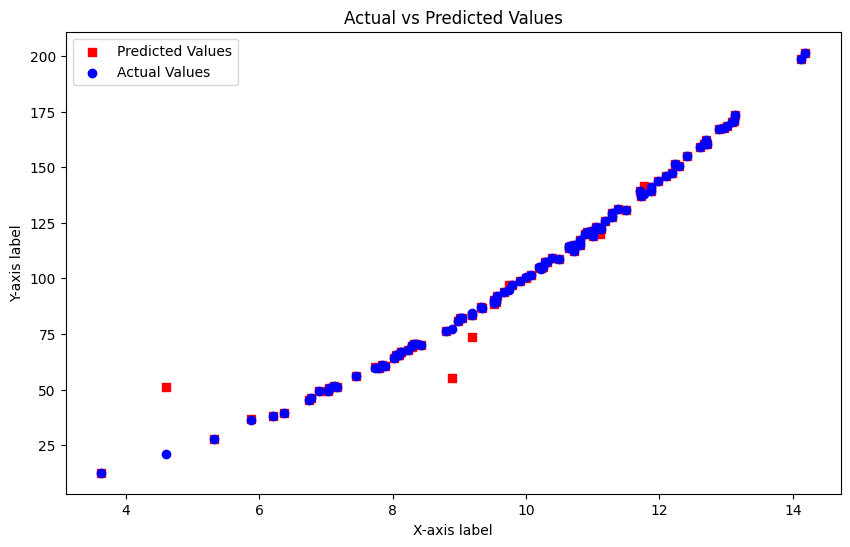

In [30]:
y = np.array(y)
#target = target.detach().numpy()
y_hat = output[:, 1].detach().numpy()

plt.figure(figsize=(10, 6))  # Optional: specifies the figure size


# Plot predicted values
plt.scatter(x, y_hat, label='Predicted Values', color='red', marker='s')  # Plot x vs. y_hat

# Plot actual values
plt.scatter(target[:, 0], target[:, 1], label='Actual Values', color='blue', marker='o')  # Plot x vs. y

plt.legend()  # Show legend to differentiate between actual and predicted values
plt.title('Actual vs Predicted Values')  # Optional: Adds a title to the plot
plt.xlabel('X-axis label')  # Optional: Label for the x-axis
plt.ylabel('Y-axis label')  # Optional: Label for the y-axis
plt.show()